# Visualisasi Data Hasil Prediksi Label (60.000 data)

Import Library

In [44]:
import matplotlib.pyplot as plt
import pandas as pd
import os
from pymongo import MongoClient
from dotenv import load_dotenv
from wordcloud import WordCloud

Inisialisasi database dan variabel env

In [45]:
# Nama database dan collection
db_name = 'youtube_rewind_indonesia'
full_labeling_all_collection_name = "full_labeling_all_new"
data_train_collection_name = "data_training_new"
data_test_collection_name = "data_testing_new"

# Memuat value dari file .env
load_dotenv()

mongodb_url = os.getenv('URL_SANDY')
local_url = os.getenv('URL_LOCAL')

Connect MongoDB dan mapping data

In [46]:
# Membuat koneksi ke MongoDB
client = MongoClient(local_url)
db = client[db_name]
full_labeling_all_collection = db[full_labeling_all_collection_name]

# Mengambil semua data dari koleksi MongoDB
data = list(full_labeling_all_collection.find())

# Membuat DataFrame dari data
df = pd.DataFrame(data)

# Mapping videoId dengan nama rewind
videoId_map = {
    "fNX6Gu2F7A8": "Rewind 2015",
    "1ZIGLm5cuDo": "Rewind 2016",
    "mCyITaDib7M": "Rewind 2018",
    "LhYfsKc0_tA": "Rewind 2020",
    "IPZO85HFM4w": "Rewind 2021",
    "Q5vQawTFJ0I": "Rewind 2023"
}

# Menambahkan kolom rewind_name berdasarkan videoId
df['rewind_name'] = df['videoId'].map(videoId_map)

## Stacked Bar Chart

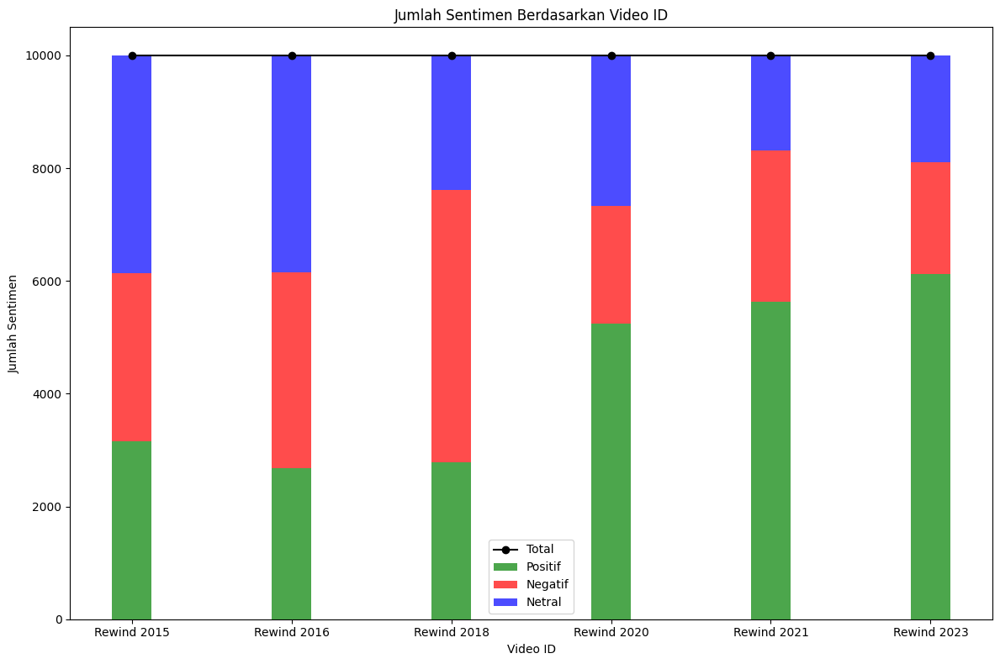

In [47]:
# Melakukan agregasi untuk menghitung jumlah sentimen berdasarkan rewind_name dan label
sentiment_counts = df.groupby(['rewind_name', 'predicted_label']).size().reset_index(name='count')

# Membuat pivot table untuk memformat data agar mudah digunakan untuk visualisasi
sentiment_pivot = sentiment_counts.pivot(index='rewind_name', columns='predicted_label', values='count').fillna(0)

# Mengurutkan berdasarkan nama rewind
sentiment_pivot = sentiment_pivot.reindex(index=list(videoId_map.values()))

# Plotting bar chart dan line chart
plt.figure(figsize=(12, 8))

# Bar chart untuk jumlah sentimen
bar_width = 0.25
labels = sentiment_pivot.index
x = range(len(labels))

plt.bar(x, sentiment_pivot['positif'], width=bar_width, label='Positif', color='green', alpha=0.7)
plt.bar(x, sentiment_pivot['negatif'], width=bar_width, label='Negatif', color='red', alpha=0.7, bottom=sentiment_pivot['positif'])
plt.bar(x, sentiment_pivot['netral'], width=bar_width, label='Netral', color='blue', alpha=0.7, bottom=sentiment_pivot['positif'] + sentiment_pivot['negatif'])

# Line chart untuk jumlah total sentimen
plt.plot(x, sentiment_pivot.sum(axis=1), marker='o', linestyle='-', color='black', label='Total')

plt.xlabel('Video ID')
plt.ylabel('Jumlah Sentimen')
plt.title('Jumlah Sentimen Berdasarkan Video ID')
plt.xticks(x, labels)
plt.legend()

plt.tight_layout()
plt.show()

## Bar Chart

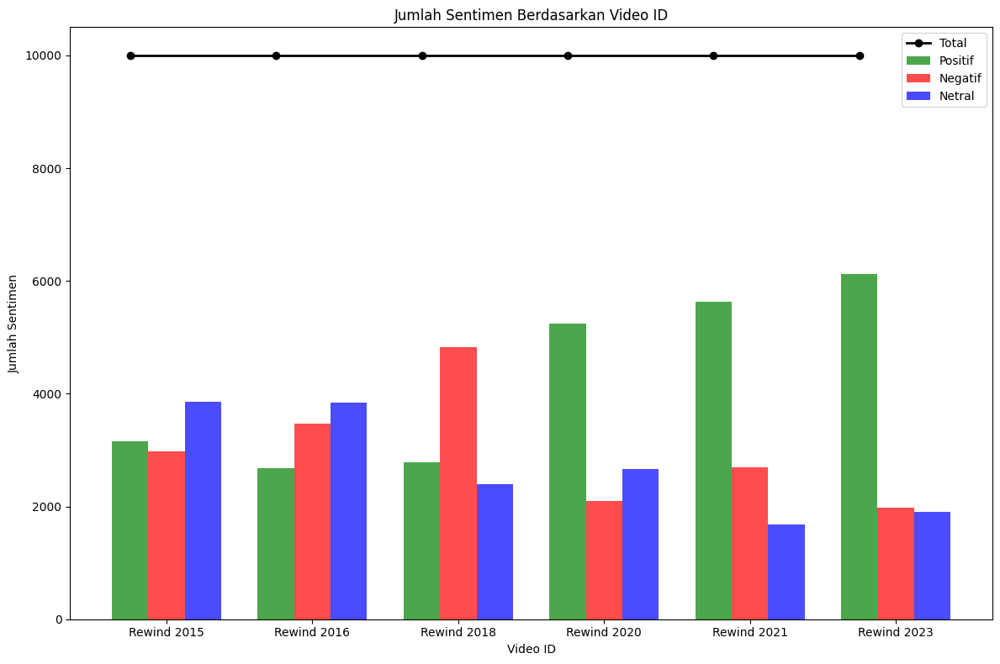

In [48]:
# Melakukan agregasi untuk menghitung jumlah sentimen berdasarkan rewind_name dan predicted_label
sentiment_counts = df.groupby(['rewind_name', 'predicted_label']).size().reset_index(name='count')

# Pivot table untuk memformat data agar mudah digunakan untuk visualisasi
sentiment_pivot = sentiment_counts.pivot(index='rewind_name', columns='predicted_label', values='count').fillna(0)

# Mengurutkan berdasarkan nama rewind
sentiment_pivot = sentiment_pivot.reindex(index=list(videoId_map.values()))

# Plotting bar chart untuk jumlah sentimen
plt.figure(figsize=(12, 8))

bar_width = 0.25
x = range(len(sentiment_pivot.index))

# Plot untuk sentimen positif
plt.bar(x, sentiment_pivot['positif'], width=bar_width, label='Positif', color='green', alpha=0.7)

# Plot untuk sentimen negatif
plt.bar([pos + bar_width for pos in x], sentiment_pivot['negatif'], width=bar_width, label='Negatif', color='red', alpha=0.7)

# Plot untuk sentimen netral
plt.bar([pos + 2 * bar_width for pos in x], sentiment_pivot['netral'], width=bar_width, label='Netral', color='blue', alpha=0.7)

# Line chart untuk total jumlah sentimen
plt.plot(x, sentiment_pivot.sum(axis=1), marker='o', linestyle='-', color='black', label='Total', linewidth=2)

plt.xlabel('Video ID')
plt.ylabel('Jumlah Sentimen')
plt.title('Jumlah Sentimen Berdasarkan Video ID')
plt.xticks([pos + bar_width for pos in x], sentiment_pivot.index)
plt.legend()

plt.tight_layout()
plt.show()

## Pie Chart Berdasarkan Tahun Rewind

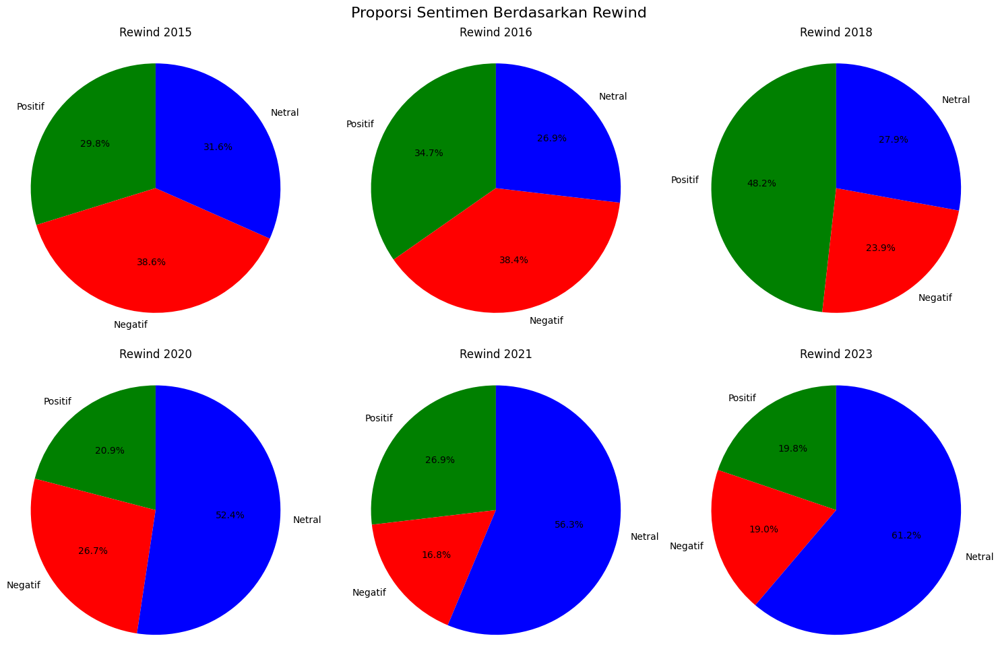

In [49]:
# Melakukan agregasi untuk menghitung jumlah sentimen berdasarkan rewind_name dan predicted_label
sentiment_counts = df.groupby(['rewind_name', 'predicted_label']).size().reset_index(name='count')

# Pivot table untuk memformat data agar mudah digunakan untuk visualisasi
sentiment_pivot = sentiment_counts.pivot(index='rewind_name', columns='predicted_label', values='count').fillna(0)

# Mengurutkan berdasarkan nama rewind
sentiment_pivot = sentiment_pivot.reindex(index=list(videoId_map.values()))

# Plotting pie chart untuk setiap rewind
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()  # Flatten the 2D array of axes for easier iteration

colors = ['green', 'red', 'blue']
labels = ['Positif', 'Negatif', 'Netral']

for i, (rewind, row) in enumerate(sentiment_pivot.iterrows()):
    sizes = row.values
    ax = axes[i]
    ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
    ax.set_title(rewind)
    ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

plt.suptitle('Proporsi Sentimen Berdasarkan Rewind', fontsize=16)
plt.tight_layout()
plt.show()


## Word Cloud dari Komentar Seluruh Video Youtube Rewind Indonesia

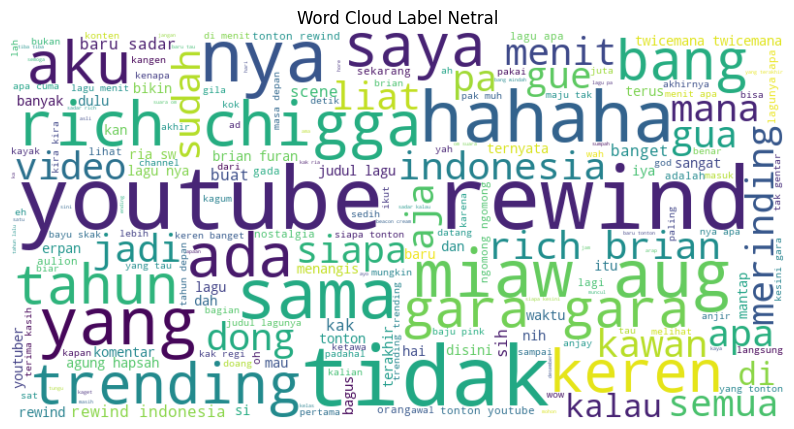

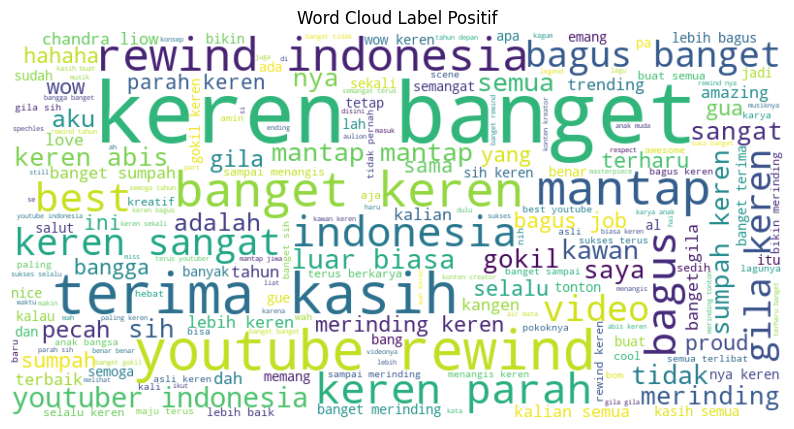

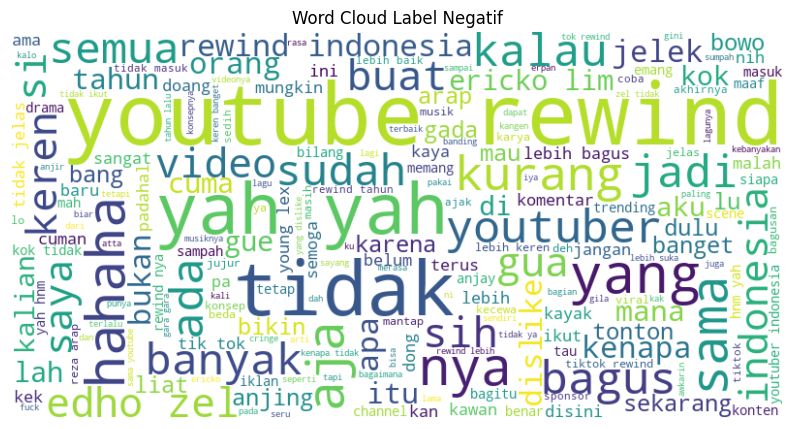

In [50]:
sentiments = ['netral', 'positif', 'negatif']
for sentiment in sentiments:
    text = ' '.join(df[df['predicted_label'] == sentiment]['textOriginal'])
    if text:
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud Label {sentiment.capitalize()}')
        plt.axis('off')
        plt.show()


## Word Cloud Berdasarkan Tahun dan Kelas Label

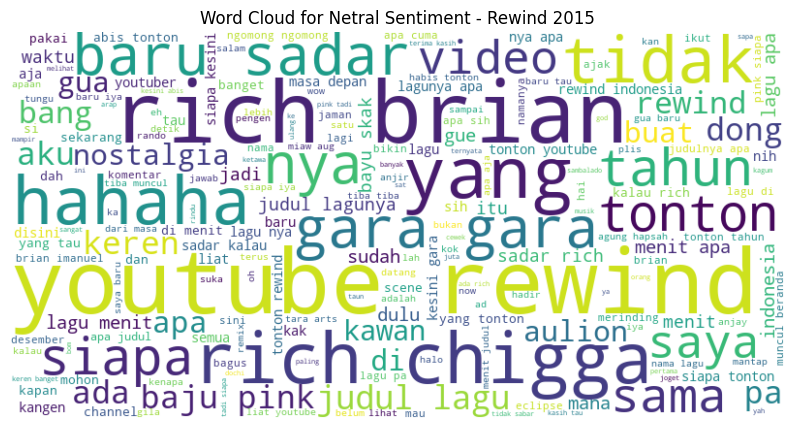

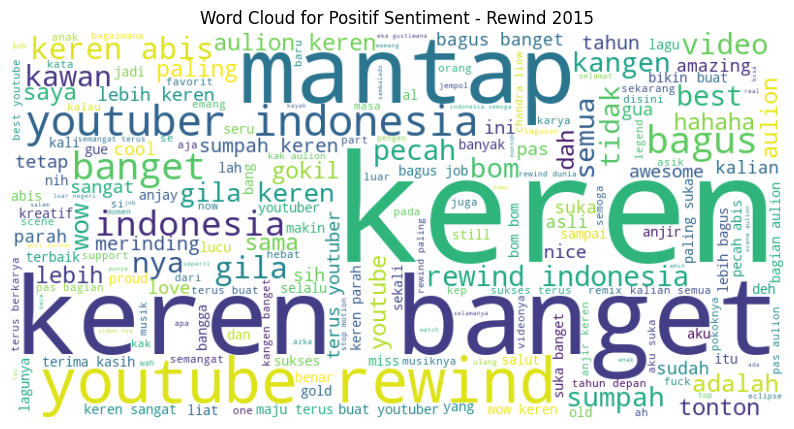

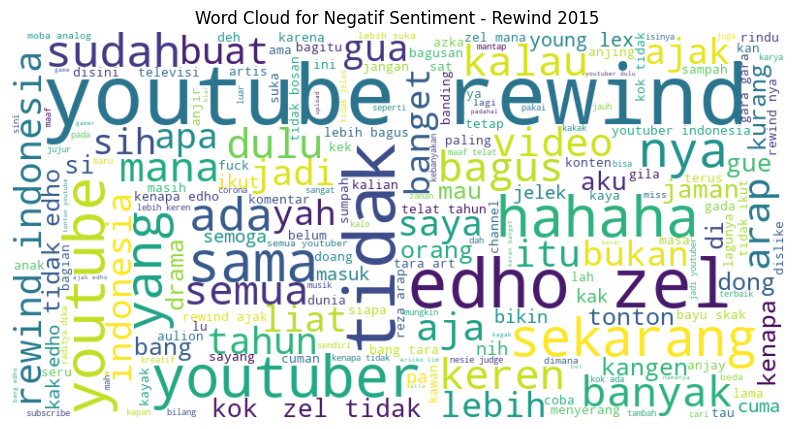

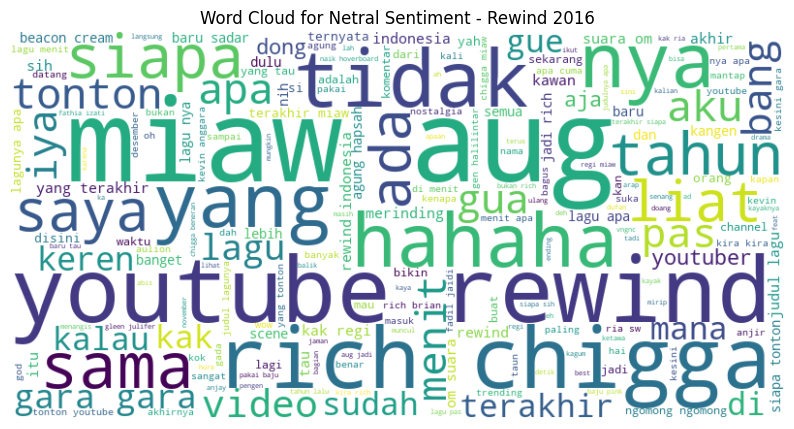

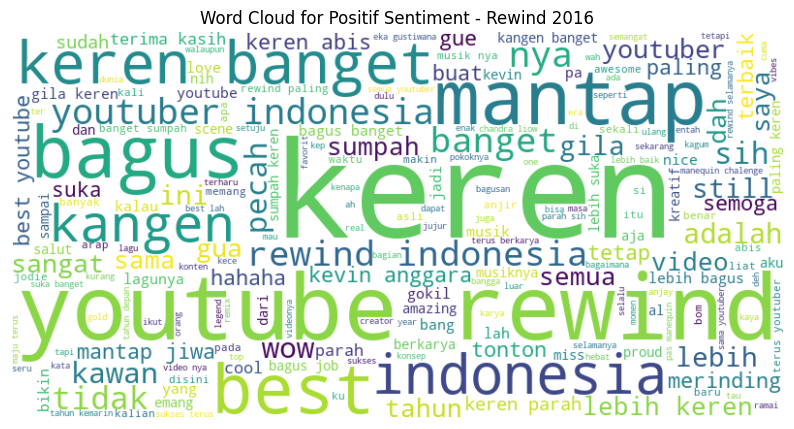

...

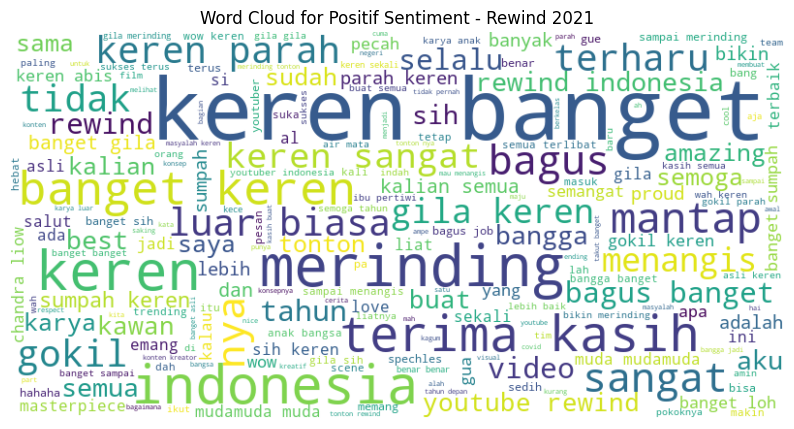

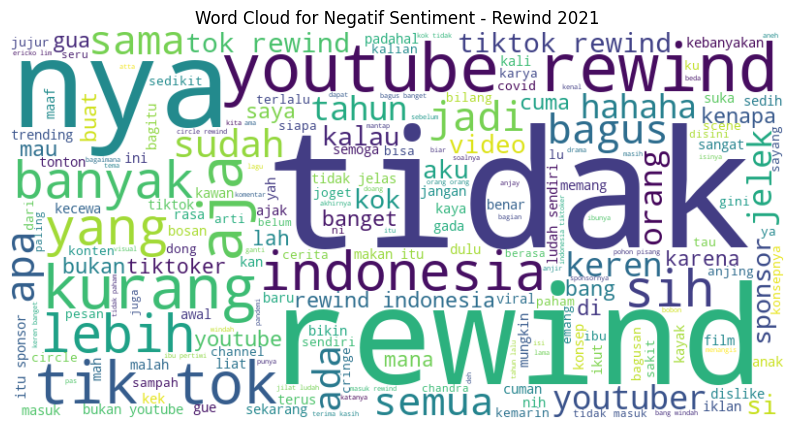

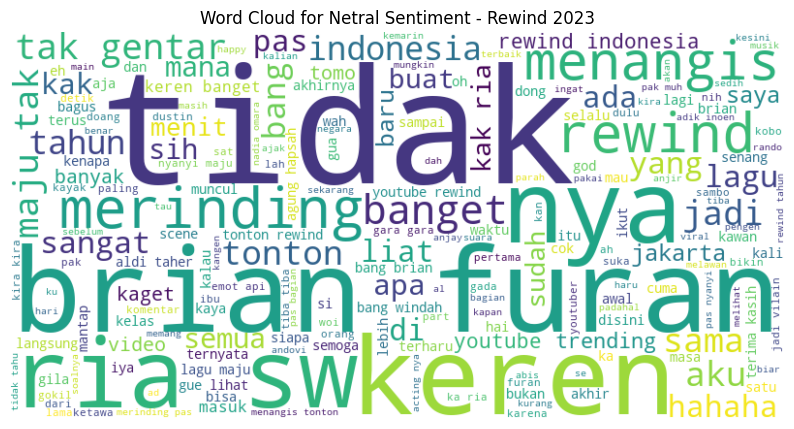

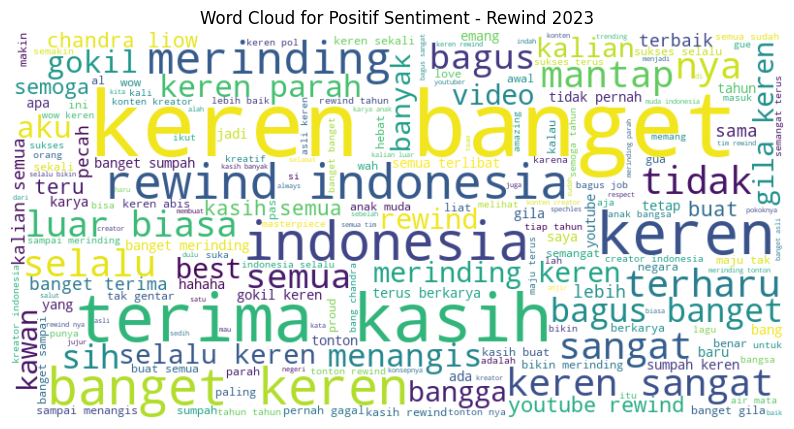

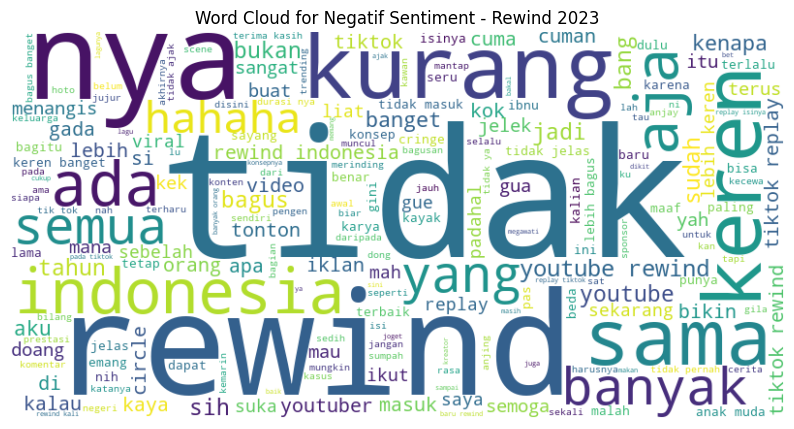

In [51]:
sentiments = ['netral', 'positif', 'negatif']
for rewind_name in videoId_map.values():
    for sentiment in sentiments:
        text = ' '.join(df[(df['rewind_name'] == rewind_name) & (df['predicted_label'] == sentiment)]['textOriginal'])
        if text:
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
            
            plt.figure(figsize=(10, 6))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f'Word Cloud for {sentiment.capitalize()} Sentiment - {rewind_name}')
            plt.axis('off')
            plt.show()


# Visualisasi Berdasarkan Atribut publishedAt dan label

In [52]:
# Konversi publishedAt ke datetime
df['publishedAt'] = pd.to_datetime(df['publishedAt'])

# Buat kolom bulan dan tahun
df['month'] = df['publishedAt'].dt.to_period('M')
df['year'] = df['publishedAt'].dt.year

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_17984\2488249445.py:5: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['month'] = df['publishedAt'].dt.to_period('M')


### Distribusi Label Berdasarkan Bulan/Tahun Semua Komentar

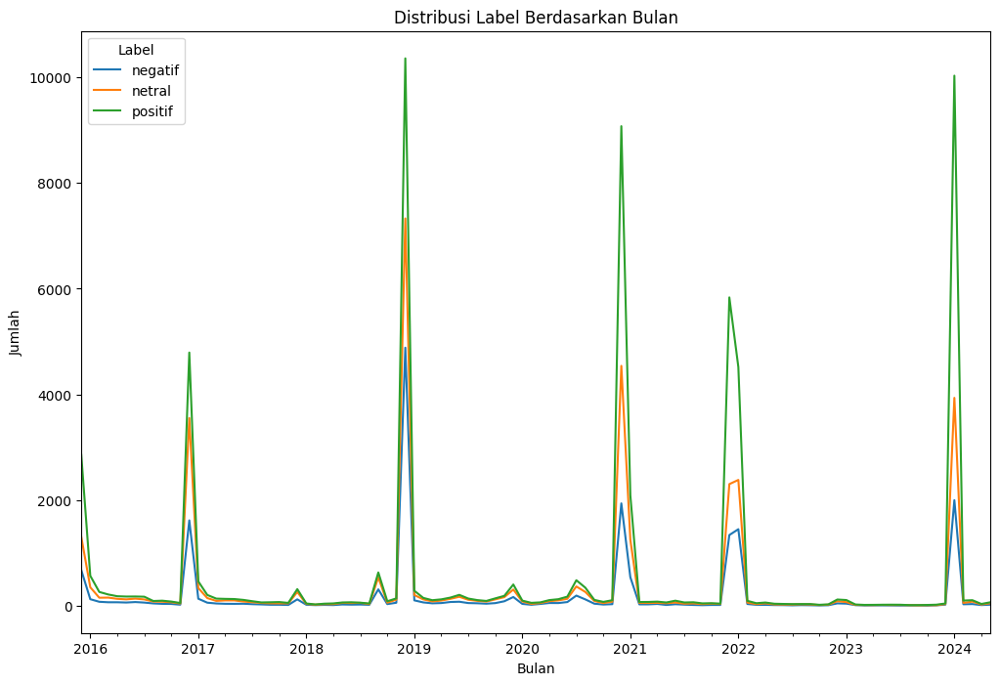

In [53]:
label_distribution = df.groupby(['month', 'predicted_label']).size().unstack().fillna(0)
label_distribution.plot(kind='line', stacked=True, figsize=(12, 8))
plt.title('Distribusi Label Berdasarkan Bulan')
plt.xlabel('Bulan')
plt.ylabel('Jumlah')
plt.legend(title='Label')
plt.show()

**CATATAN**

Dikarenakan kami menganalisis video Youtube Rewind, maka jika divisualisasikan dalam grafik garis maka hanya terjadi lonjakan jumlah komentar hanya pada 1 periode tertentu saja, misalkan pada akhir tahun. Sehingga tidak terdapat periode yang memiliki perbedaan signifikan antar label. Misalnya tidak terdapat periode yang hanya salah satu label yang mengalami kenaikan, sementara label lainnya konstan. Jumlah data antar label akan selalu berdampingan satu sama lainnya.

#### Rewind 2015

##### Line chart sebaran komentar Rewind 2015 pada semua periode

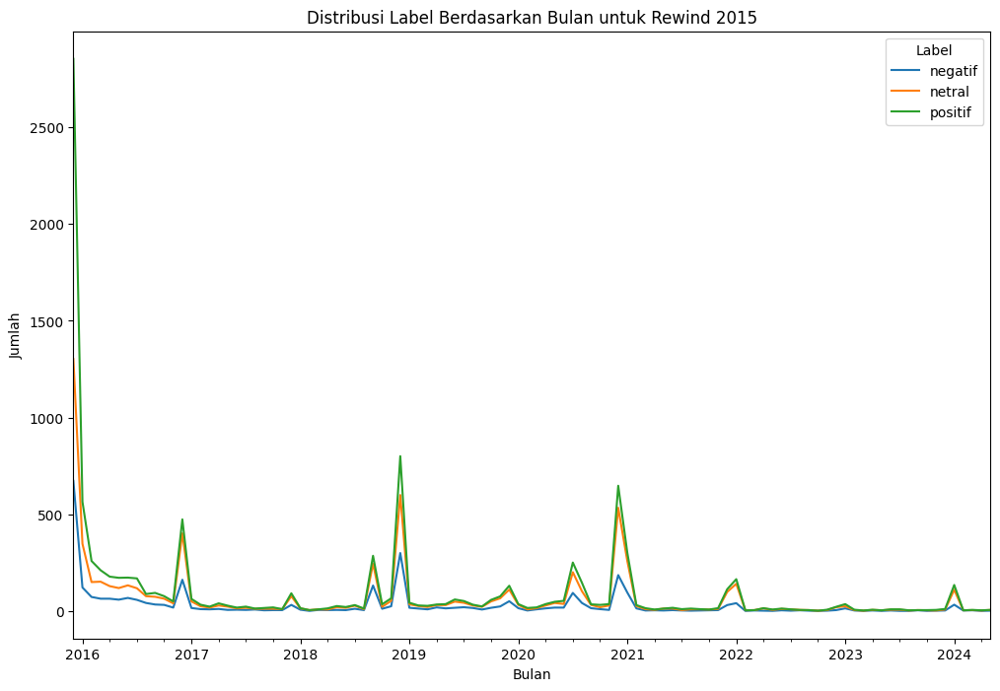

In [70]:
# Filter data untuk hanya menampilkan 1 rewind
rewind_year = "Rewind 2015"
df_rewind_year = df[df['rewind_name'] == rewind_year]

# Mengelompokkan data berdasarkan bulan dan label yang diprediksi
label_distribution = df_rewind_year.groupby(['month', 'predicted_label']).size().unstack().fillna(0)

# Plot distribusi label
label_distribution.plot(kind='line', stacked=True, figsize=(12, 8))
plt.title(f'Distribusi Label Berdasarkan Bulan untuk {rewind_year}')
plt.xlabel('Bulan')
plt.ylabel('Jumlah')
plt.legend(title='Label')
plt.show()

##### Visualisasi Rewind 2015 yang diperjelas berdasarkan tahun

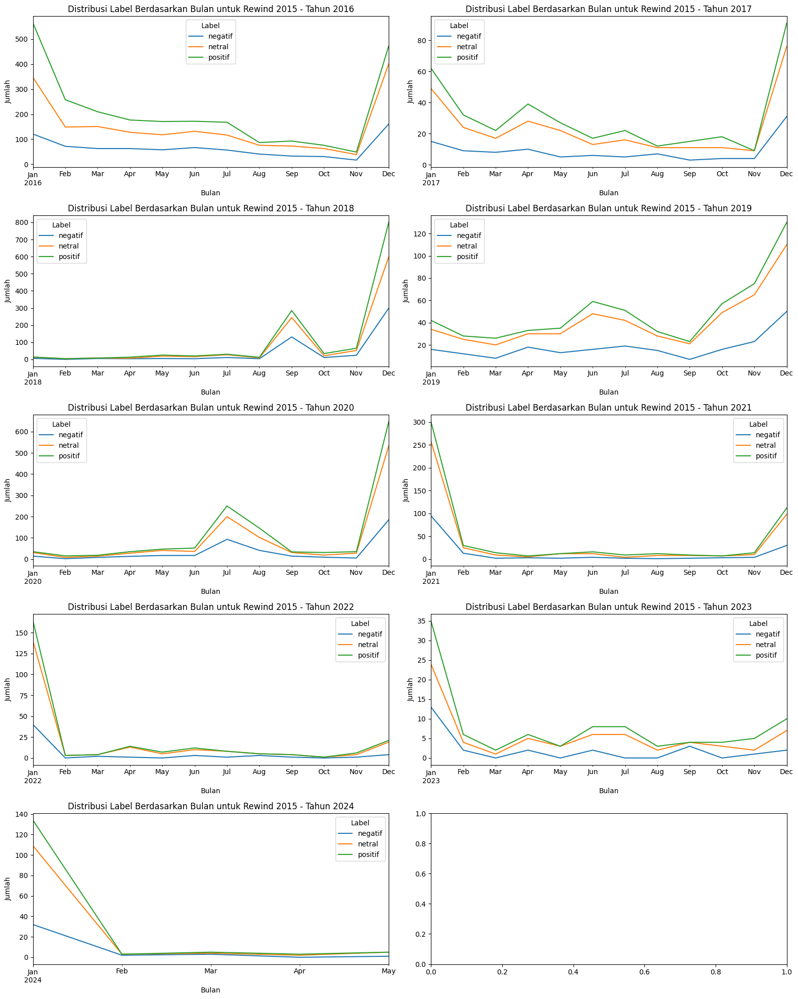

In [73]:
# Menentukan tahun-tahun yang akan ditampilkan
tahun_urutan = ['2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']

# Mengatur ukuran dan layout subplot
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(16, 20))

# Loop untuk menghasilkan plot untuk setiap tahun
for i, tahun in enumerate(tahun_urutan):
    # Filter data untuk tahun tertentu
    df_rewind_year = df[(df['rewind_name'] == rewind_year) & (df['publishedAt'].dt.year == int(tahun))]
    
    # Mengelompokkan data berdasarkan bulan dan label yang diprediksi
    label_distribution = df_rewind_year.groupby(['month', 'predicted_label']).size().unstack().fillna(0)
    
    # Plot distribusi label pada subplot yang sesuai
    row = i // 2  # Baris ke-berapa (0-3)
    col = i % 2   # Kolom ke-berapa (0-1)
    ax = axes[row, col]
    label_distribution.plot(kind='line', stacked=True, ax=ax)
    ax.set_title(f'Distribusi Label Berdasarkan Bulan untuk {rewind_year} - Tahun {tahun}')
    ax.set_xlabel('Bulan')
    ax.set_ylabel('Jumlah')
    ax.legend(title='Label')

# Menyusun layout subplot
plt.tight_layout()
plt.show()


##### Word Cloud yang menampilkan topik-topik yang dibicarakan pada Rewind 2015

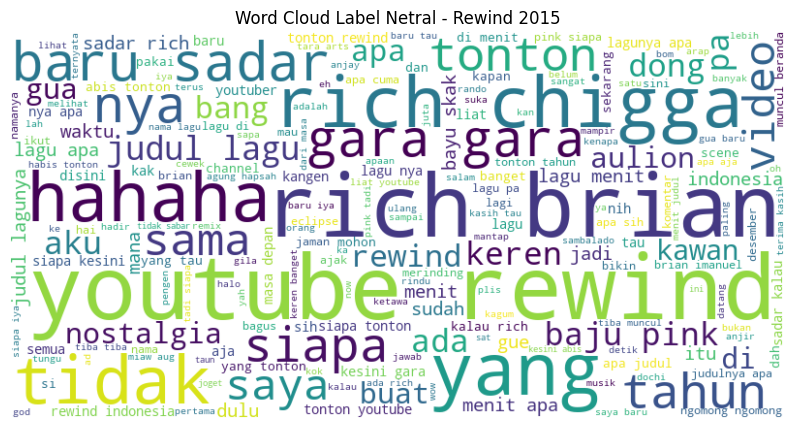

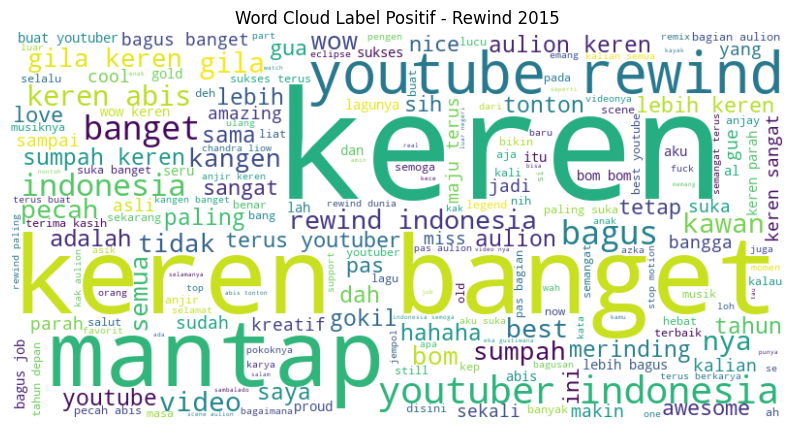

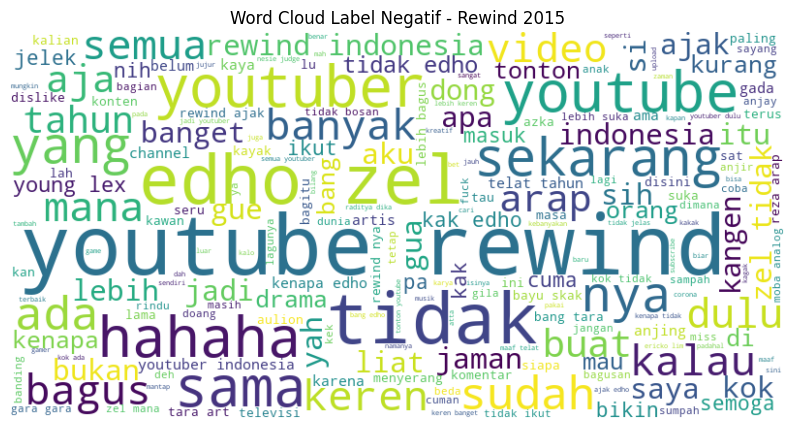

In [ ]:
sentiments = ['netral', 'positif', 'negatif']

for sentiment in sentiments:
    text = ' '.join(df[(df['rewind_name'] == rewind_year) & (df['predicted_label'] == sentiment)]['textOriginal'])
    if text:
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud Label {sentiment.capitalize()} - {rewind_year}')
        plt.axis('off')
        plt.show()

#### Rewind 2016

##### Line chart sebaran komentar Rewind 2016 pada semua periode

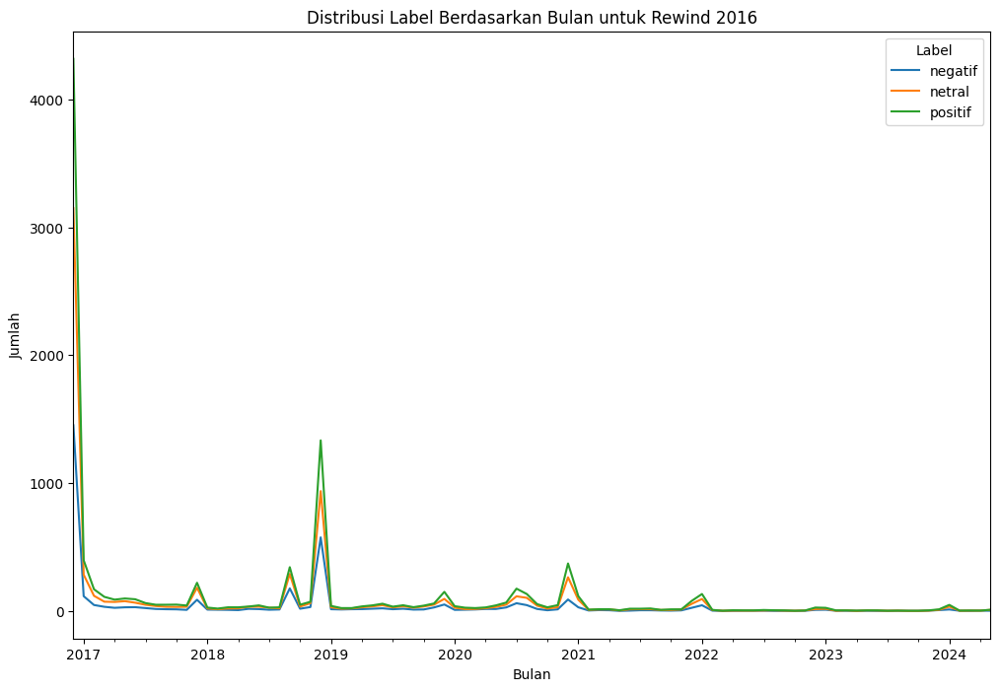

In [74]:
# Filter data untuk hanya menampilkan 1 rewind
rewind_year = "Rewind 2016"
df_rewind_year = df[df['rewind_name'] == rewind_year]

# Mengelompokkan data berdasarkan bulan dan label yang diprediksi
label_distribution = df_rewind_year.groupby(['month', 'predicted_label']).size().unstack().fillna(0)

# Plot distribusi label
label_distribution.plot(kind='line', stacked=True, figsize=(12, 8))
plt.title(f'Distribusi Label Berdasarkan Bulan untuk {rewind_year}')
plt.xlabel('Bulan')
plt.ylabel('Jumlah')
plt.legend(title='Label')
plt.show()

##### Visualisasi Rewind 2016 yang diperjelas berdasarkan tahun

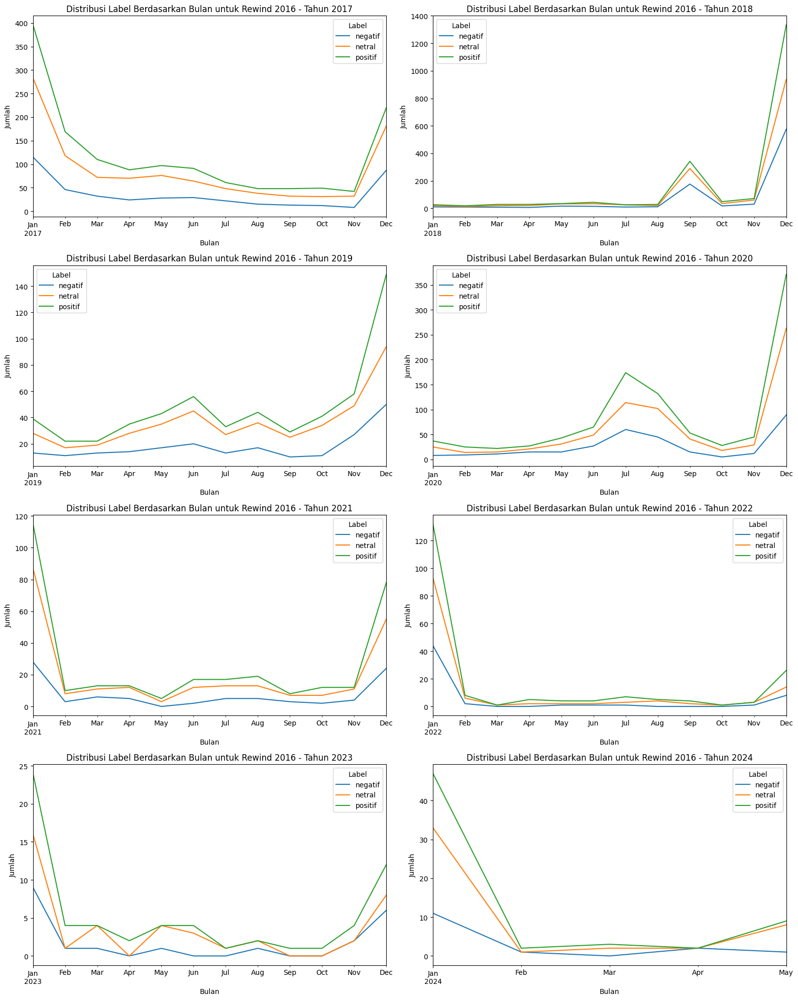

In [75]:
# Menentukan tahun-tahun yang akan ditampilkan
tahun_urutan = ['2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']

# Mengatur ukuran dan layout subplot
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 20))

# Loop untuk menghasilkan plot untuk setiap tahun
for i, tahun in enumerate(tahun_urutan):
    # Filter data untuk tahun tertentu
    df_rewind_year = df[(df['rewind_name'] == rewind_year) & (df['publishedAt'].dt.year == int(tahun))]
    
    # Mengelompokkan data berdasarkan bulan dan label yang diprediksi
    label_distribution = df_rewind_year.groupby(['month', 'predicted_label']).size().unstack().fillna(0)
    
    # Plot distribusi label pada subplot yang sesuai
    row = i // 2  # Baris ke-berapa (0-3)
    col = i % 2   # Kolom ke-berapa (0-1)
    ax = axes[row, col]
    label_distribution.plot(kind='line', stacked=True, ax=ax)
    ax.set_title(f'Distribusi Label Berdasarkan Bulan untuk {rewind_year} - Tahun {tahun}')
    ax.set_xlabel('Bulan')
    ax.set_ylabel('Jumlah')
    ax.legend(title='Label')

# Menyusun layout subplot
plt.tight_layout()
plt.show()


##### Word Cloud yang menampilkan topik-topik yang dibicarakan pada Rewind 2016

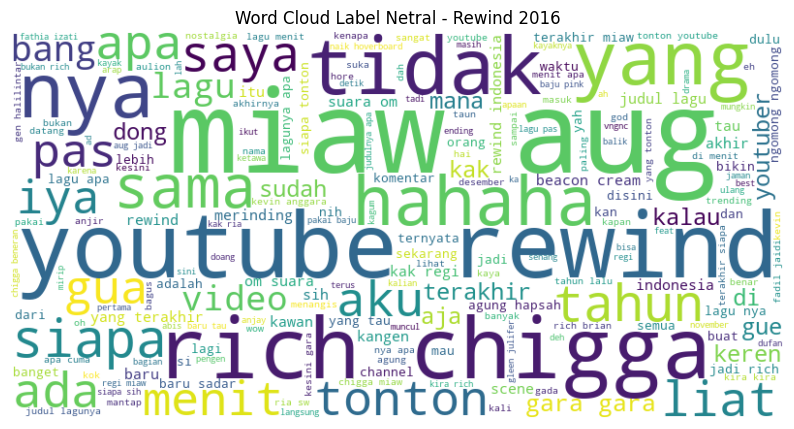

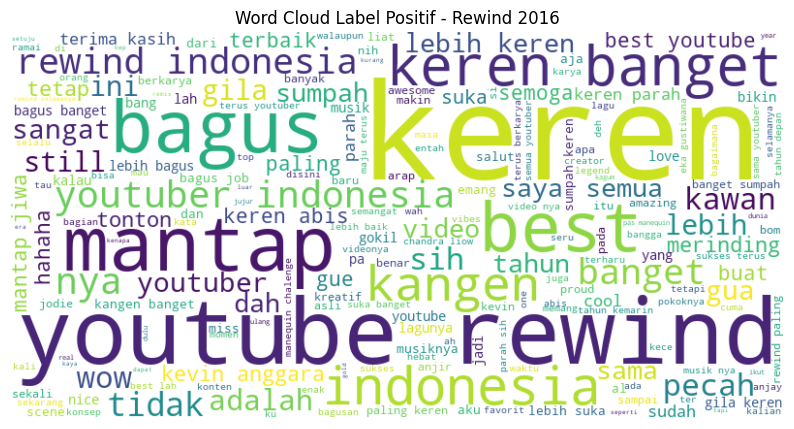

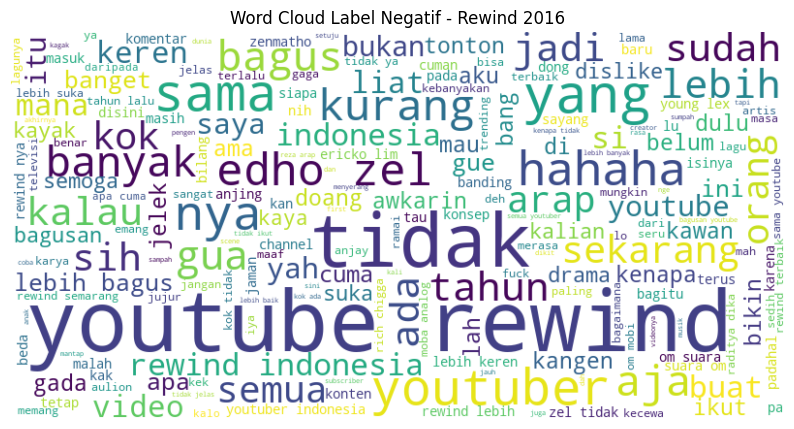

In [ ]:
sentiments = ['netral', 'positif', 'negatif']

for sentiment in sentiments:
    text = ' '.join(df[(df['rewind_name'] == rewind_year) & (df['predicted_label'] == sentiment)]['textOriginal'])
    if text:
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud Label {sentiment.capitalize()} - {rewind_year}')
        plt.axis('off')
        plt.show()

#### Rewind 2018

##### Line chart sebaran komentar Rewind 2015 pada semua periode

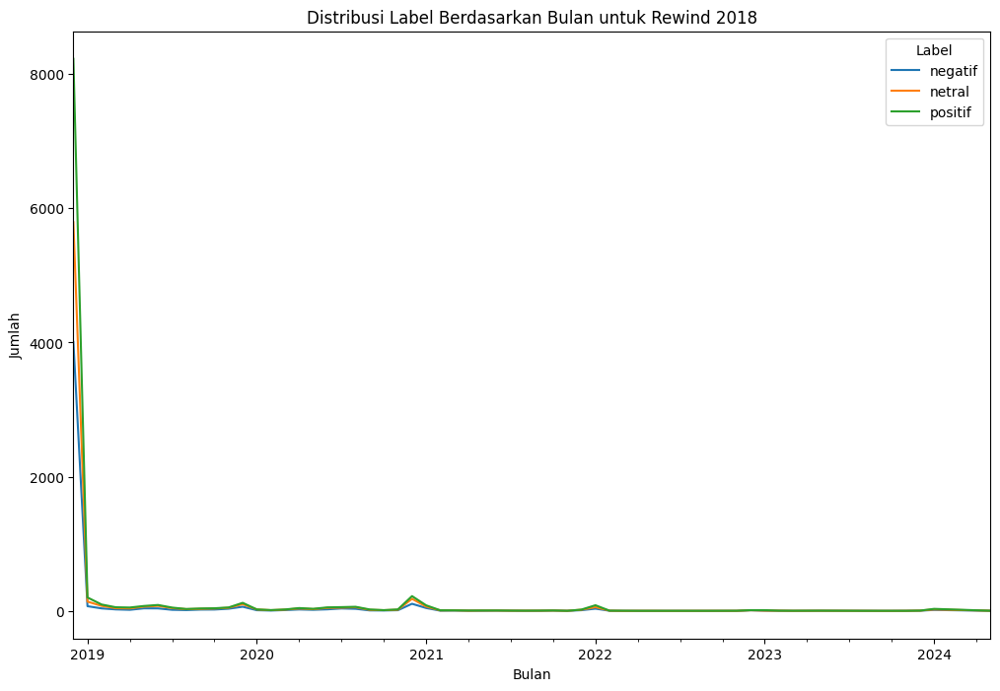

In [76]:
# Filter data untuk hanya menampilkan 1 rewind
rewind_year = "Rewind 2018"
df_rewind_year = df[df['rewind_name'] == rewind_year]

# Mengelompokkan data berdasarkan bulan dan label yang diprediksi
label_distribution = df_rewind_year.groupby(['month', 'predicted_label']).size().unstack().fillna(0)

# Plot distribusi label
label_distribution.plot(kind='line', stacked=True, figsize=(12, 8))
plt.title(f'Distribusi Label Berdasarkan Bulan untuk {rewind_year}')
plt.xlabel('Bulan')
plt.ylabel('Jumlah')
plt.legend(title='Label')
plt.show()

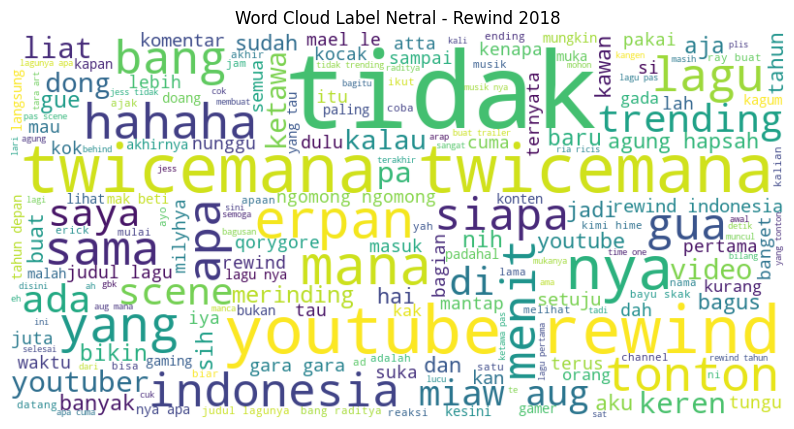

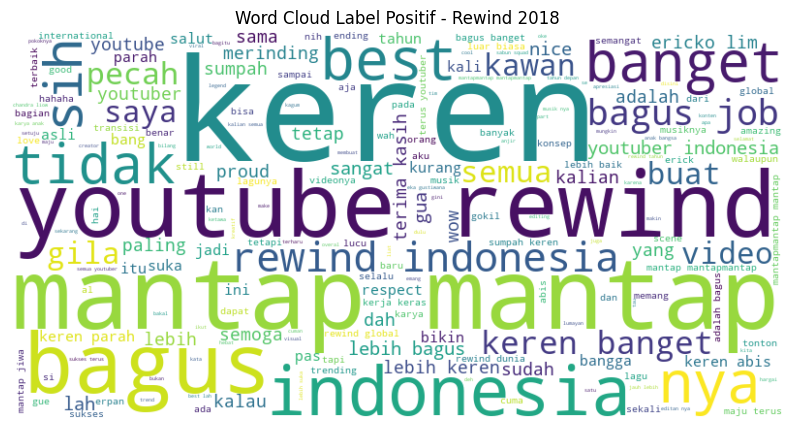

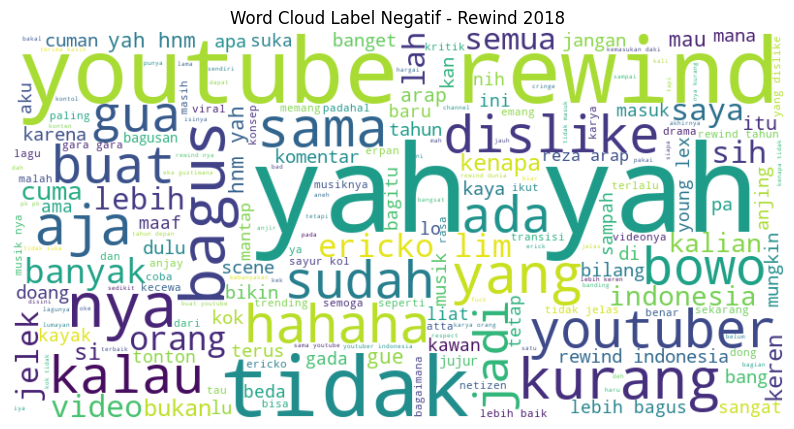

In [ ]:
sentiments = ['netral', 'positif', 'negatif']

for sentiment in sentiments:
    text = ' '.join(df[(df['rewind_name'] == rewind_year) & (df['predicted_label'] == sentiment)]['textOriginal'])
    if text:
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud Label {sentiment.capitalize()} - {rewind_year}')
        plt.axis('off')
        plt.show()